# Importações

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

# Consumindo bases

In [ ]:
url_internacoes = 'https://raw.githubusercontent.com/AILAB-CEFET-RJ/qualiar/refs/heads/main/NEW_TEST/Data/SUS/sus_internacoes_por_poluicao_final.csv'

df_internacoes = pd.read_csv(url_internacoes, sep=',')

url_sensores = 'https://raw.githubusercontent.com/AILAB-CEFET-RJ/qualiar/refs/heads/main/NEW_TEST/Data/Sensores/rio_de_janeiro_sensores_boxcox'

df_sensores = pd.read_csv(url_sensores, sep=',')

# Unificando as bases

In [3]:
#@title Unindo os DataFrames agregados
df_merged = pd.merge(df_sensores, df_internacoes, on=['data_formatada'], how='inner')

In [4]:
display(df_merged.head(10))

,data_formatada,ano,mes,classificacao,chuva,temp,ur,co,no,no2,nox,so2,o3,pm10,pm2_5,aqi,num_internacoes
0,2012-01-01,2012,1,N1 - Boa,0.125360,20.699502,150.278938,0.215578,1.255933,4.167875,2.762548,1.469239,6.471631,3.008264,3.841279,1.764576,72
1,2012-01-02,2012,1,N1 - Boa,0.129591,18.477452,156.597005,0.181741,1.883802,4.400359,3.009491,1.130226,6.015490,2.552152,2.241183,1.704668,116
2,2012-01-03,2012,1,N1 - Boa,0.001037,20.057649,120.934232,0.165688,2.020305,4.492876,3.098142,1.849169,5.252830,3.014046,2.009550,1.764576,72
3,2012-01-04,2012,1,N1 - Boa,0.002065,20.826092,115.348559,0.170838,2.173895,5.072352,3.312328,1.617111,6.756880,3.345294,3.972002,1.864224,64
4,2012-01-05,2012,1,N1 - Boa,0.000000,21.188040,120.017462,0.169572,2.006521,4.821368,3.170513,1.598864,7.891868,3.275266,3.345935,1.878974,68
5,2012-01-06,2012,1,N1 - Boa,0.127778,21.615752,123.422916,0.191062,1.839848,4.899010,3.126896,1.968926,7.911238,3.105600,2.913199,1.820905,108
6,2012-01-07,2012,1,N1 - Boa,0.011846,22.023323,113.562019,0.187275,1.821929,4.367415,2.974739,1.727412,8.042270,2.924001,2.824903,1.864224,28
7,2012-01-08,2012,1,N1 - Boa,0.121315,21.128115,130.210155,0.198586,1.623758,4.821941,3.047449,2.374745,8.428215,3.219182,3.967218,1.878974,72
8,2012-01-09,2012,1,N1 - Boa,0.075855,20.129507,137.777164,0.172003,1.913247,4.763735,3.116841,1.595716,5.648249,2.670269,2.371997,1.721290,88
9,2012-01-10,2012,1,N1 - Boa,0.114182,20.867718,126.707157,0.197623,2.160504,4.983237,3.286071,2.021478,4.998584,3.112801,2.875251,1.789080,68


In [ ]:
df_merged.to_csv('internacoes_x_poluentes.csv', index=False)

In [14]:
#@title Aplicando o StandardScaler


# 1. Colunas que não serão padronizadas
columns_to_scale = ['pm2_5',	'pm10',	'no',	'no2',	'nox',	'temp',	'o3',	'co',	'so2', 'ur', 'chuva']

# Initialize the StandardScaler
scaler = StandardScaler()

# Apply the scaler to the selected columns
df_merged[columns_to_scale] = scaler.fit_transform(df_merged[columns_to_scale])

columns_to_log = ['num_internacoes']

# Aplicar a transformação logarítmica às colunas selecionadas
df_merged[columns_to_log] = df_merged[columns_to_log].apply(np.log1p)

# df_merged = df_merged[(df_merged['ano'] < 2020)]

# Display the scaled DataFrame
display(df_merged.tail())

,data_formatada,ano,mes,classificacao,chuva,temp,ur,co,no,no2,nox,so2,o3,pm10,pm2_5,aqi,num_internacoes,mes_ano
4458,2024-12-24,2024,12,N1 - Boa,0.772795,-0.273562,1.732326,-0.956063,-0.673221,-2.284756,-1.917282,0.580126,-0.687323,-1.049697,-1.465102,1.704668,0.741276,2024-12
4459,2024-12-25,2024,12,N1 - Boa,-0.633249,0.705619,0.817987,-0.654473,-1.008206,-2.208970,-2.034676,0.976254,0.076712,-1.406842,-1.408269,1.800282,0.959135,2024-12
4460,2024-12-26,2024,12,N1 - Boa,1.488617,0.516134,0.692569,0.543459,-0.067421,-0.606417,-0.460042,1.967900,-0.824253,-1.478444,-1.669788,1.721290,0.526589,2024-12
4461,2024-12-28,2024,12,N1 - Boa,1.809260,0.209750,1.663793,0.235774,-0.493628,-0.819512,-0.786742,0.995696,0.832695,-1.968339,-1.616196,1.856353,0.741276,2024-12
4462,2024-12-29,2024,12,N1 - Boa,-0.692277,0.226010,1.728352,0.466004,-1.427884,-1.829653,-1.905448,0.249949,0.746747,-1.651771,-1.736516,1.820905,0.526589,2024-12


# Matrix de correlação por dia


In [20]:
#@title Gerando correlação entre as colunas

# Drop non-numeric columns before grouping and calculating the mean
df_grouped = df_merged.drop(columns=['classificacao', 'ano', 'mes']).groupby(['data_formatada']).mean().reset_index()

correlation_matrix = df_grouped[['chuva', 'ur', 'pm2_5', 'pm10', 'no', 'no2', 'nox', 'temp', 'o3', 'co', 'so2', 'aqi', 'num_internacoes']].corr()

In [22]:
df_grouped

,data_formatada,chuva,temp,ur,co,no,no2,nox,so2,o3,pm10,pm2_5,aqi,num_internacoes
0,2012-01-01,0.125360,20.699502,150.278938,0.215578,1.255933,4.167875,2.762548,1.469239,6.471631,3.008264,3.841279,1.764576,36.0
1,2012-01-03,0.001037,20.057649,120.934232,0.165688,2.020305,4.492876,3.098142,1.849169,5.252830,3.014046,2.009550,1.764576,20.0
2,2012-01-04,0.002065,20.826092,115.348559,0.170838,2.173895,5.072352,3.312328,1.617111,6.756880,3.345294,3.972002,1.864224,20.0
3,2012-01-05,0.000000,21.188040,120.017462,0.169572,2.006521,4.821368,3.170513,1.598864,7.891868,3.275266,3.345935,1.878974,8.0
4,2012-01-07,0.011846,22.023323,113.562019,0.187275,1.821929,4.367415,2.974739,1.727412,8.042270,2.924001,2.824903,1.864224,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4458,2024-12-24,0.068680,20.099259,146.219543,0.159782,1.629500,3.265702,2.573729,2.343384,6.791695,2.954944,2.123304,1.704668,2.0
4459,2024-12-25,0.004092,22.515309,128.864933,0.170096,1.533290,3.311086,2.544160,2.591444,7.898585,2.842589,2.188479,1.800282,4.0
4460,2024-12-26,0.101562,22.047770,126.484432,0.211063,1.803491,4.270767,2.940771,3.212424,6.593320,2.820064,1.888571,1.721290,1.0
4461,2024-12-28,0.116291,21.291792,144.918755,0.200541,1.681080,4.143156,2.858483,2.603619,8.993808,2.665946,1.950029,1.856353,2.0


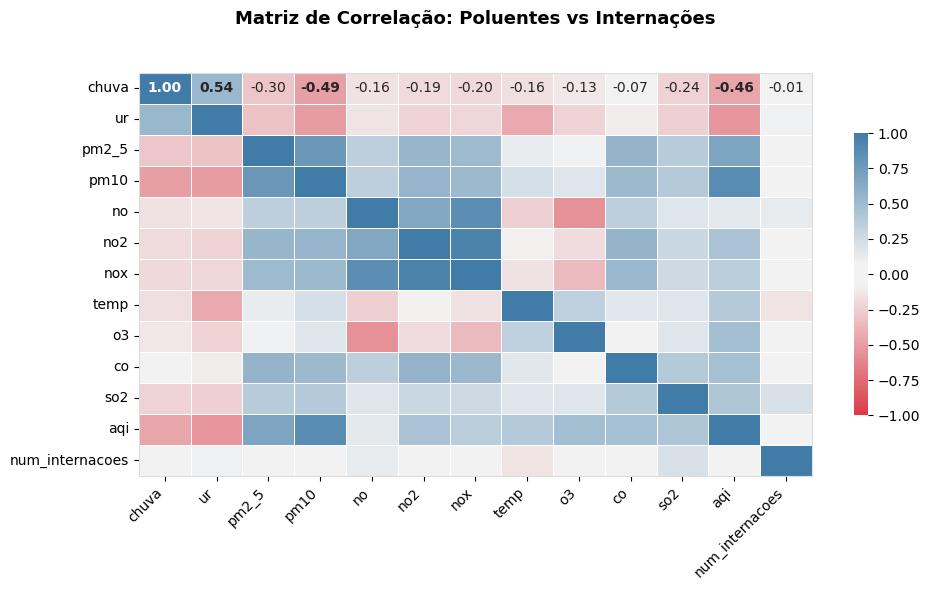

In [25]:
#@title Heatmap de Correlação - Versão Simplificada

# Configurações do gráfico
plt.figure(figsize=(10, 6))

# Paleta de cores
cor_palette = sns.diverging_palette(10, 240, sep=20, as_cmap=True)

# Plot do heatmap
ax = sns.heatmap(correlation_matrix,
                 annot=True,
                 cmap=cor_palette,
                 fmt='.2f',
                 linewidths=0.5,
                 linecolor='white',
                 cbar_kws={'shrink': 0.7},
                 annot_kws={'size': 10},
                 vmin=-1,
                 vmax=1)

# Ajustes estéticos
plt.title('Matriz de Correlação: Poluentes vs Internações\n',
          fontsize=13, pad=20, fontweight='bold')
ax.set_facecolor('#f8f9fa')  # Fundo cinza claro

# Melhorando os rótulos
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

# Adicionando grade sutil
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_color('#dddddd')

# Destacando valores importantes
for text in ax.texts:
    t = float(text.get_text())
    if abs(t) >= 0.45:
        text.set_fontweight('bold')

plt.tight_layout()
plt.show()

# Matrix de correlação por mês


In [26]:
df_merged['data_formatada'] = pd.to_datetime(df_merged['data_formatada'])

df_merged['ano'] = df_merged['data_formatada'].dt.year
df_merged['mes'] = df_merged['data_formatada'].dt.month
df_merged['mes_ano'] = df_merged['ano'].astype(str) + '-' + df_merged['mes'].astype(str)

display(df_merged.tail())

,data_formatada,ano,mes,classificacao,chuva,temp,ur,co,no,no2,nox,so2,o3,pm10,pm2_5,aqi,num_internacoes,mes_ano
4458,2024-12-24,2024,12,N1 - Boa,0.068680,20.099259,146.219543,0.159782,1.629500,3.265702,2.573729,2.343384,6.791695,2.954944,2.123304,1.704668,2,2024-12
4459,2024-12-25,2024,12,N1 - Boa,0.004092,22.515309,128.864933,0.170096,1.533290,3.311086,2.544160,2.591444,7.898585,2.842589,2.188479,1.800282,4,2024-12
4460,2024-12-26,2024,12,N1 - Boa,0.101562,22.047770,126.484432,0.211063,1.803491,4.270767,2.940771,3.212424,6.593320,2.820064,1.888571,1.721290,1,2024-12
4461,2024-12-28,2024,12,N1 - Boa,0.116291,21.291792,144.918755,0.200541,1.681080,4.143156,2.858483,2.603619,8.993808,2.665946,1.950029,1.856353,2,2024-12
4462,2024-12-29,2024,12,N1 - Boa,0.001381,21.331913,146.144109,0.208414,1.412755,3.538239,2.576710,2.136624,8.869293,2.765536,1.812048,1.820905,1,2024-12


In [27]:
#@title Gerando correlação entre as colunas

# Drop non-numeric columns before grouping and calculating the mean
df_grouped = df_merged.drop(columns=['classificacao', 'data_formatada', 'mes_ano']).groupby(['ano', 'mes']).mean().reset_index()

correlation_matrix = df_grouped[['chuva', 'ur', 'pm2_5', 'pm10', 'no', 'no2', 'nox', 'temp', 'o3', 'co', 'so2', 'aqi', 'num_internacoes']].corr()

In [28]:
df_grouped

,ano,mes,chuva,temp,ur,co,no,no2,nox,so2,o3,pm10,pm2_5,aqi,num_internacoes
0,2012,1,0.049907,22.052176,117.339993,0.189556,1.910036,4.755055,3.124296,2.139660,7.226177,3.268949,3.244833,1.883906,11.000000
1,2012,2,0.020282,23.763150,100.833022,0.181521,1.824735,4.715173,3.078549,2.547340,8.625258,3.440301,3.161606,1.946787,14.307692
2,2012,3,0.039068,22.361222,114.854144,0.183527,1.900744,4.931338,3.166270,2.427048,7.962687,3.305666,3.385010,1.897806,16.666667
3,2012,4,0.039090,21.360873,123.648976,0.202568,2.012241,4.961864,3.221691,2.020689,7.224046,3.300694,3.468258,1.872463,16.413793
4,2012,5,0.037718,19.059030,123.120920,0.209831,2.235667,5.144681,3.379436,2.088127,6.080280,3.317850,3.622668,1.855746,25.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,2024,8,0.012157,18.754823,115.237856,0.210110,1.809988,4.859293,3.109635,NaN,9.067687,3.497502,3.945635,1.909935,6.000000
152,2024,9,0.007438,20.877033,118.424896,0.231703,1.556225,4.665317,2.976161,NaN,9.701036,3.620126,4.504250,1.950753,6.033333
153,2024,10,0.035066,20.444400,127.462619,0.204781,1.558115,3.758759,2.690767,NaN,9.331904,3.159962,2.887943,1.856179,4.172414
154,2024,11,0.028720,21.087999,128.172203,0.187498,1.571329,3.873658,2.741886,2.523253,8.299335,3.072395,2.357376,1.832229,3.965517


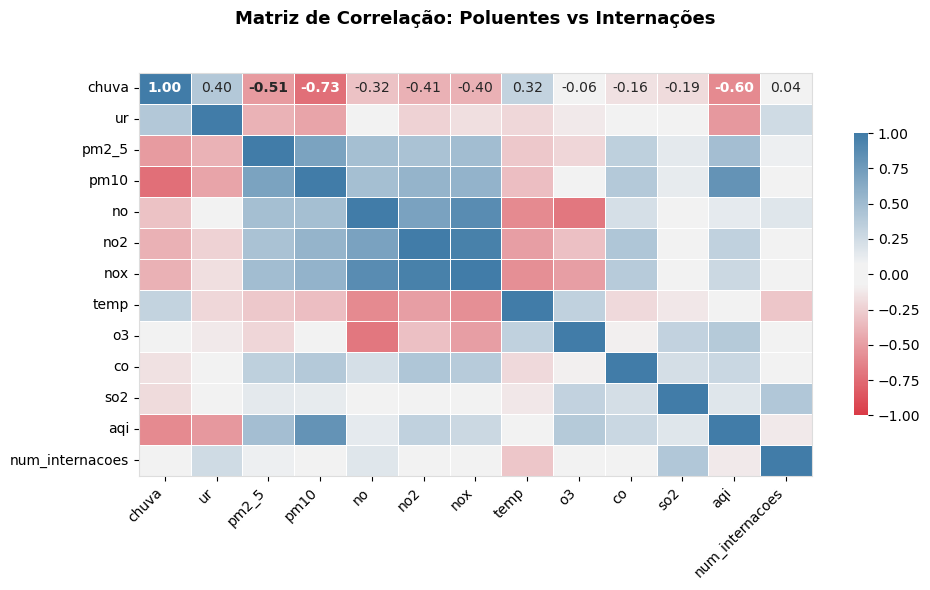

In [29]:
#@title Heatmap de Correlação - Versão Simplificada

# Configurações do gráfico
plt.figure(figsize=(10, 6))

# Paleta de cores
cor_palette = sns.diverging_palette(10, 240, sep=20, as_cmap=True)

# Plot do heatmap
ax = sns.heatmap(correlation_matrix,
                 annot=True,
                 cmap=cor_palette,
                 fmt='.2f',
                 linewidths=0.5,
                 linecolor='white',
                 cbar_kws={'shrink': 0.7},
                 annot_kws={'size': 10},
                 vmin=-1,
                 vmax=1)

# Ajustes estéticos
plt.title('Matriz de Correlação: Poluentes vs Internações\n',
          fontsize=13, pad=20, fontweight='bold')
ax.set_facecolor('#f8f9fa')  # Fundo cinza claro

# Melhorando os rótulos
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

# Adicionando grade sutil
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_color('#dddddd')

# Destacando valores importantes
for text in ax.texts:
    t = float(text.get_text())
    if abs(t) >= 0.45:
        text.set_fontweight('bold')

plt.tight_layout()
plt.show()

# Série temporal por poluente - Não está funcionando por agora

### PM2.5

In [274]:
poluente = 'pm2_5'

#### Serie temporal

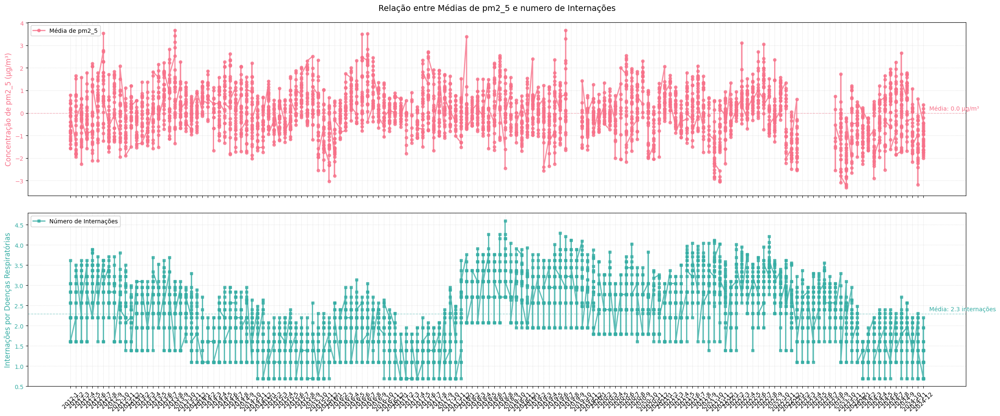

In [275]:
#@title Gráfico Principal: Relação entre PM2.5 e Internações com Eixo X

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Mesma paleta do gráfico principal

# Criar figura com subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10), sharex=True)  # Gráficos empilhados para melhor comparação

# --- Gráfico 1: Média Móvel de PM2.5 ---
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'Média de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2,
        marker='o',
        markersize=5,
        alpha=0.8)


ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.5)
ax1.legend(loc='upper left', framealpha=1)
ax1.set_title(f'Relação entre Médias de {poluente} e numero de Internações', fontsize=14, pad=20)

# --- Gráfico 2: Internações ---
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2,
        marker='s',
        markersize=5,
        alpha=0.8)


ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.5)
ax2.legend(loc='upper left', framealpha=1)

# --- Melhorias no Eixo X ---
# Formatação das datas
plt.xticks(rotation=45)

# --- Elementos Adicionais ---
# Adicionar valores médios como linhas de referência
mean_pm = df_merged[poluente].mean()
mean_int = df_merged['num_internacoes'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[0],
            fontsize=10)

ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[1],
            fontsize=10)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)  # Reduzir espaço entre os gráficos

# Mostrar o gráfico
plt.show()

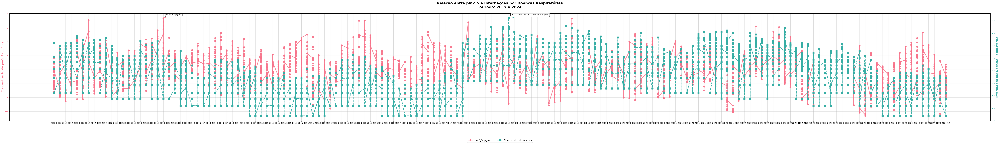

In [277]:
#@title Gráfico Principal Sobreposto: Relação entre PM2.5 e Internações

palette = sns.color_palette("husl", 2)

# Criar figura com tamanho aumentado
plt.figure(figsize=(70, 10))  # Aumentei a altura para 10 para melhor espaçamento

# Eixo principal
ax1 = plt.gca()

# Plotar PM2.5 (eixo esquerdo)
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'{poluente} (µg/m³)',
        color=palette[0],
        marker='o',
        linestyle='-',
        linewidth=3,
        markersize=8,
        alpha=0.9)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)',
              color=palette[0],
              fontsize=14,
              fontweight='bold')
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, alpha=0.3)

# Eixo direito para internações
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='--',
        marker='s',
        linewidth=3,
        markersize=8)
ax2.set_ylabel('Internações por Doenças Respiratórias',
              color=palette[1],
              fontsize=14,
              fontweight='bold')
ax2.tick_params(axis='y', labelcolor=palette[1])

# Destacar valores máximos
max_pm = df_merged[poluente].max()
max_pm_date = df_merged.loc[df_merged[poluente].idxmax(), 'mes_ano']
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[0]))

max_int = df_merged['num_internacoes'].max()
max_int_date = df_merged.loc[df_merged['num_internacoes'].idxmax(), 'mes_ano']
ax2.annotate(f'Máx: {max_int} internações',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[1]))

# ===== MELHORIAS NO EIXO X =====

# Adicionar linhas de grade para os anos
ax1.grid(which='major', axis='x', linestyle='-', alpha=0.5)
ax1.grid(which='minor', axis='x', linestyle=':', alpha=0.3)

# Ajustar margens para evitar cortes
plt.margins(x=0.05)

# ===== TÍTULO E LEGENDAS =====
plt.title(f'Relação entre {poluente} e Internações por Doenças Respiratórias\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=18,
         fontweight='bold',
         pad=25)

# Legendas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=2,
          fontsize=12)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Mais espaço na parte inferior

plt.show()

#### Media movel

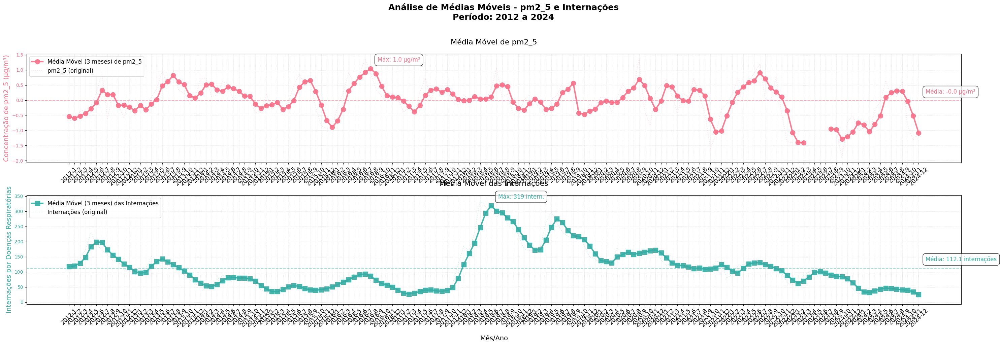

In [ ]:
#@title Gráficos Separados com Eixo X Rotacionado 45°

# Configurações iniciais
palette = sns.color_palette("husl", 2)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(30, 10))  # 2 linhas, 1 coluna


df_merged[f'{poluente}_moving_avg'] = df_merged[poluente].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses
df_merged['internacoes_moving_avg'] = df_merged['num_internacoes'].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses

# --- Primeiro Gráfico: Média Móvel do Poluente ---
# Média móvel
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=3,
        marker='o',
        markersize=10,
        alpha=0.9)

# Série original
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=14)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)
ax1.set_title(f'Média Móvel de {poluente}', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1.5)
ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmax(), 'mes_ano']
max_pm = df_merged[f'{poluente}_moving_avg'].max()
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax1.legend(loc='upper left', fontsize=12)

# --- Segundo Gráfico: Média Móvel das Internações ---
# Média móvel
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=3,
        marker='s',
        markersize=10,
        alpha=0.9)

# Série original
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_xlabel('Mês/Ano', fontsize=14, labelpad=15)
ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=14)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.3)
ax2.set_title('Média Móvel das Internações', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax2.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_int = df_merged['internacoes_moving_avg'].mean()
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1.5)
ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax2.legend(loc='upper left', fontsize=12)

# --- Ajustes Finais ---
plt.suptitle(f'Análise de Médias Móveis - {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
             fontsize=18,
             y=1.02,
             fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0.3)  # Espaço entre os gráficos

plt.show()

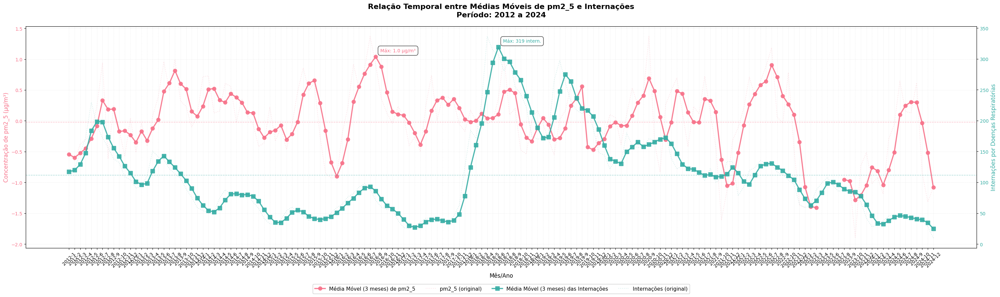

In [ ]:
#@title Média Móvel Sobreposta com Eixo X Rotacionado

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Paleta harmoniosa

# Criar figura
plt.figure(figsize=(30, 10))  # Mantendo a largura original, mas ajustando altura

# Eixo principal
ax1 = plt.gca()

# --- Média Móvel do Poluente (Eixo Esquerdo) ---
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2.5,
        marker='o',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_xlabel('Mês/Ano', fontsize=12, labelpad=10)
ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=10)  # Adicionado aqui

# --- Média Móvel das Internações (Eixo Direito) ---
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2.5,
        marker='s',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])

# --- Melhorias Visuais ---
# Título
plt.title(f'Relação Temporal entre Médias Móveis de {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=16,
         pad=20,
         fontweight='bold')

# Legendas unificadas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=4,
          fontsize=11,
          framealpha=1)

# Destacar valores médios
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
mean_int = df_merged['internacoes_moving_avg'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

# Anotações para valores máximos
max_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmax(), 'mes_ano']
max_pm = df_merged[f'{poluente}_moving_avg'].max()
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[0],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[1],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

# Ajustar layout com mais espaço na parte inferior para a legenda
plt.tight_layout()
plt.subplots_adjust(bottom=0.25)  # Aumentado para 0.25 para acomodar labels rotacionados

plt.show()

### PM10

In [278]:
poluente = 'pm10'

ValueError: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

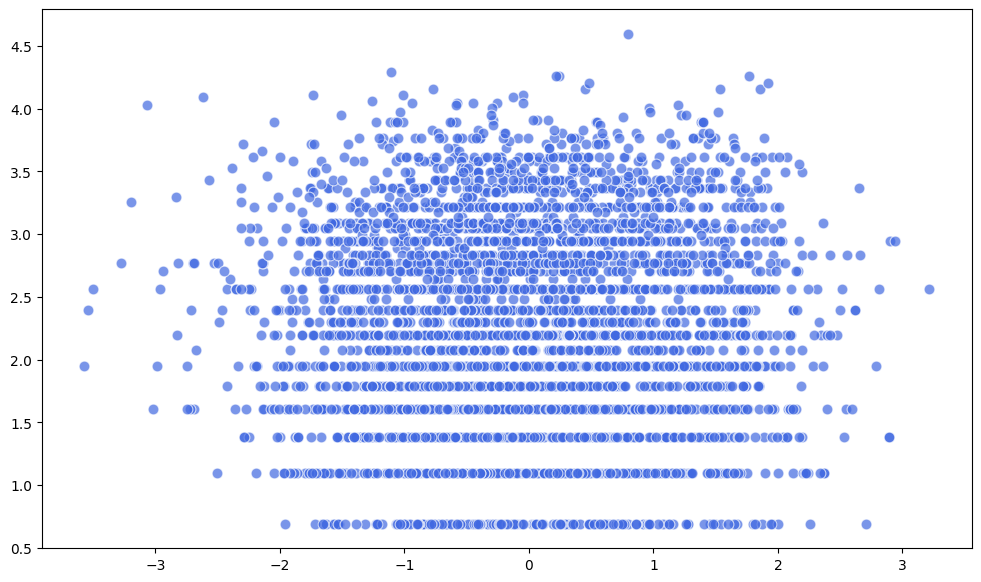

In [279]:
#@title Gráfico de Dispersão: PM10 vs Internações

# Configurações iniciais
plt.figure(figsize=(12, 7))

# ========== GRÁFICO PRINCIPAL ==========
# Scatter plot com pontos uniformes
plt.scatter(
    x=df_merged[poluente],
    y=df_merged['num_internacoes'],
    color='royalblue',  # Cor única para todos os pontos
    s=60,              # Tamanho fixo
    alpha=0.7,
    edgecolor='white',
    linewidth=0.8,
    label='Dados Observados'
)

# ========== LINHA DE TENDÊNCIA ==========
# Regressão linear
reg = LinearRegression()
X = df_merged[poluente].values.reshape(-1, 1)
y = df_merged['num_internacoes'].values
reg.fit(X, y)
y_pred = reg.predict(X)

# Plot da linha de regressão
plt.plot(X, y_pred, color='crimson', linewidth=2.5, linestyle='--',
         label=f'Linha de Tendência (R²={reg.score(X,y):.2f})')

# Intervalo de confiança (mais sutil)
sns.regplot(x=df_merged[poluente], y=df_merged['num_internacoes'],
            scatter=False, ci=95,
            line_kws={'color':'crimson', 'alpha':0.2})

# ========== ELEMENTOS ESTATÍSTICOS ==========
# Caixa de texto com estatísticas (mais discreta)
stats_text = f'''
Estatísticas:
Correlação: {df_merged[poluente].corr(df_merged["num_internacoes"]):.2f}
Equação: y = {reg.coef_[0]:.2f}x + {reg.intercept_:.2f}
'''
plt.gcf().text(0.15, 0.82, stats_text,
              bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgray'),
              fontsize=10)

# ========== FORMATANDO VISUALIZAÇÃO ==========
# Rótulos e título
plt.xlabel(f'Concentração de {poluente} (µg/m³)', fontsize=12, fontweight='bold')
plt.ylabel('Internações por Doenças Respiratórias', fontsize=12, fontweight='bold')
plt.title(f'Relação entre {poluente} e Internações Respiratórias',
          fontsize=14, pad=15, fontweight='bold')

# Grade e layout
plt.grid(True, which='both', linestyle=':', alpha=0.4)
plt.tight_layout()

# ========== DESTAQUES ==========
# Destacar apenas o ponto de máximo (opcional)
max_pm_idx = df_merged[poluente].idxmax()
plt.scatter(df_merged.loc[max_pm_idx, poluente],
            df_merged.loc[max_pm_idx, 'num_internacoes'],
            color='gold', s=100, edgecolor='black',
            label='Máxima concentração')

# Legendas
plt.legend(loc='upper right', framealpha=1)

plt.show()

#### Serie temporal

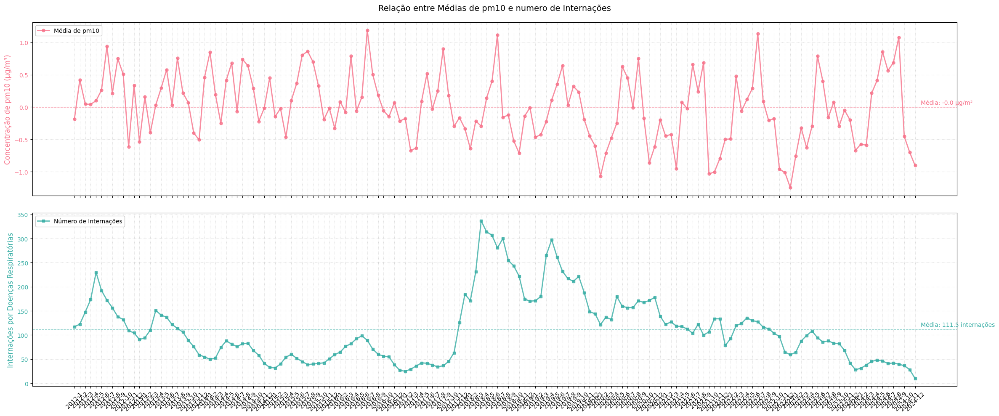

In [ ]:
#@title Gráfico Principal: Relação entre PM10 e Internações com Eixo X

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Mesma paleta do gráfico principal

# Criar figura com subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10), sharex=True)  # Gráficos empilhados para melhor comparação

# --- Gráfico 1: Média Móvel de PM10 ---
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'Média de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2,
        marker='o',
        markersize=5,
        alpha=0.8)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.5)
ax1.legend(loc='upper left', framealpha=1)
ax1.set_title(f'Relação entre Médias de {poluente} e numero de Internações', fontsize=14, pad=20)

# --- Gráfico 2: Internações ---
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2,
        marker='s',
        markersize=5,
        alpha=0.8)


ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.5)
ax2.legend(loc='upper left', framealpha=1)

# --- Melhorias no Eixo X ---
# Formatação das datas
plt.xticks(rotation=45)

# --- Elementos Adicionais ---
# Adicionar valores médios como linhas de referência
mean_pm = df_merged[poluente].mean()
mean_int = df_merged['num_internacoes'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[0],
            fontsize=10)

ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[1],
            fontsize=10)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)  # Reduzir espaço entre os gráficos

# Mostrar o gráfico
plt.show()

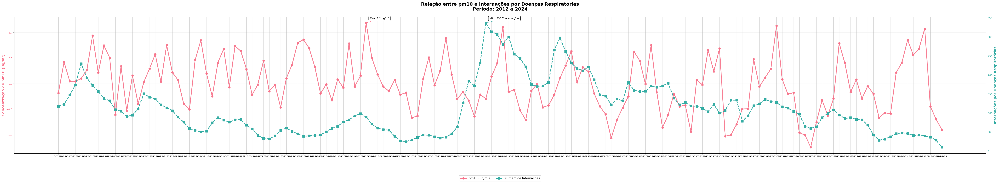

In [ ]:
#@title Gráfico Principal Sobreposto: Relação entre PM10 e Internações

palette = sns.color_palette("husl", 2)

# Criar figura com tamanho aumentado
plt.figure(figsize=(55, 10))  # Aumentei a altura para 10 para melhor espaçamento

# Eixo principal
ax1 = plt.gca()

# Plotar PM10 (eixo esquerdo)
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'{poluente} (µg/m³)',
        color=palette[0],
        marker='o',
        linestyle='-',
        linewidth=3,
        markersize=8,
        alpha=0.9)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)',
              color=palette[0],
              fontsize=14,
              fontweight='bold')
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, alpha=0.3)

# Eixo direito para internações
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='--',
        marker='s',
        linewidth=3,
        markersize=8)
ax2.set_ylabel('Internações por Doenças Respiratórias',
              color=palette[1],
              fontsize=14,
              fontweight='bold')
ax2.tick_params(axis='y', labelcolor=palette[1])

# Destacar valores máximos
max_pm = df_merged[poluente].max()
max_pm_date = df_merged.loc[df_merged[poluente].idxmax(), 'mes_ano']
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[0]))

max_int = df_merged['num_internacoes'].max()
max_int_date = df_merged.loc[df_merged['num_internacoes'].idxmax(), 'mes_ano']
ax2.annotate(f'Máx: {max_int} internações',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[1]))

# ===== MELHORIAS NO EIXO X =====

# Adicionar linhas de grade para os anos
ax1.grid(which='major', axis='x', linestyle='-', alpha=0.5)
ax1.grid(which='minor', axis='x', linestyle=':', alpha=0.3)

# Ajustar margens para evitar cortes
plt.margins(x=0.05)

# ===== TÍTULO E LEGENDAS =====
plt.title(f'Relação entre {poluente} e Internações por Doenças Respiratórias\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=18,
         fontweight='bold',
         pad=25)

# Legendas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=2,
          fontsize=12)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Mais espaço na parte inferior

plt.show()

#### Media movel

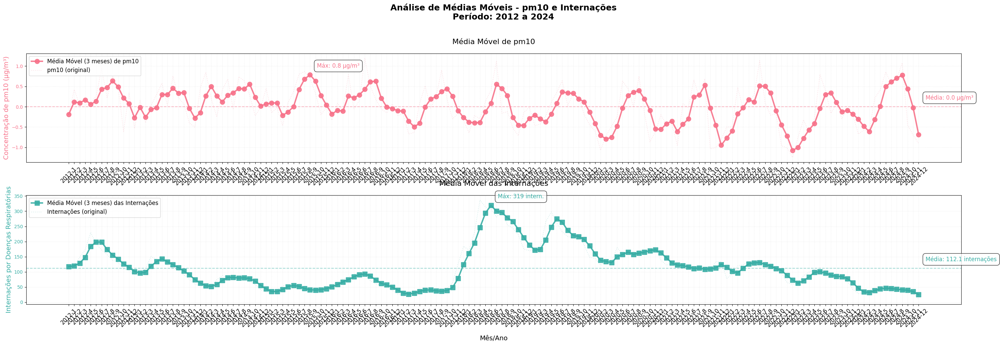

In [ ]:
#@title Gráficos Separados com Eixo X Rotacionado 45°

# Configurações iniciais
palette = sns.color_palette("husl", 2)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(30, 10))  # 2 linhas, 1 coluna


df_merged[f'{poluente}_moving_avg'] = df_merged[poluente].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses
df_merged['internacoes_moving_avg'] = df_merged['num_internacoes'].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses

# --- Primeiro Gráfico: Média Móvel do Poluente ---
# Média móvel
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=3,
        marker='o',
        markersize=10,
        alpha=0.9)

# Série original
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=14)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)
ax1.set_title(f'Média Móvel de {poluente}', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1.5)
ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmax(), 'mes_ano']
max_pm = df_merged[f'{poluente}_moving_avg'].max()
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax1.legend(loc='upper left', fontsize=12)

# --- Segundo Gráfico: Média Móvel das Internações ---
# Média móvel
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=3,
        marker='s',
        markersize=10,
        alpha=0.9)

# Série original
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_xlabel('Mês/Ano', fontsize=14, labelpad=15)
ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=14)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.3)
ax2.set_title('Média Móvel das Internações', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax2.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_int = df_merged['internacoes_moving_avg'].mean()
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1.5)
ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax2.legend(loc='upper left', fontsize=12)

# --- Ajustes Finais ---
plt.suptitle(f'Análise de Médias Móveis - {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
             fontsize=18,
             y=1.02,
             fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0.3)  # Espaço entre os gráficos

plt.show()

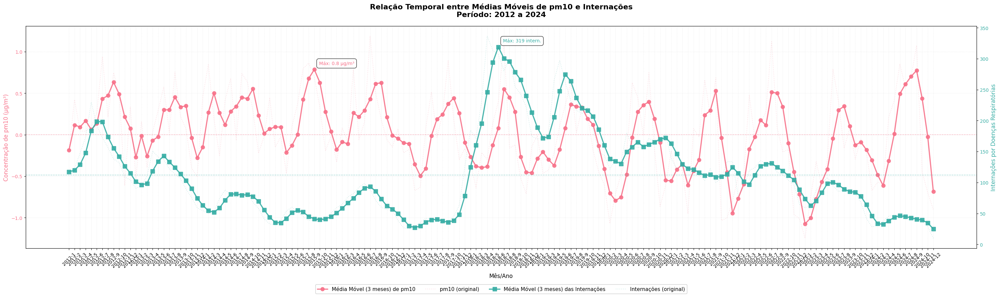

In [ ]:
#@title Média Móvel Sobreposta com Eixo X Rotacionado

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Paleta harmoniosa

# Criar figura
plt.figure(figsize=(30, 10))  # Mantendo a largura original, mas ajustando altura

# Eixo principal
ax1 = plt.gca()

# --- Média Móvel do Poluente (Eixo Esquerdo) ---
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2.5,
        marker='o',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_xlabel('Mês/Ano', fontsize=12, labelpad=10)
ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=10)  # Adicionado aqui

# --- Média Móvel das Internações (Eixo Direito) ---
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2.5,
        marker='s',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])

# --- Melhorias Visuais ---
# Título
plt.title(f'Relação Temporal entre Médias Móveis de {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=16,
         pad=20,
         fontweight='bold')

# Legendas unificadas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=4,
          fontsize=11,
          framealpha=1)

# Destacar valores médios
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
mean_int = df_merged['internacoes_moving_avg'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

# Anotações para valores máximos
max_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmax(), 'mes_ano']
max_pm = df_merged[f'{poluente}_moving_avg'].max()
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[0],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[1],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

# Ajustar layout com mais espaço na parte inferior para a legenda
plt.tight_layout()
plt.subplots_adjust(bottom=0.25)  # Aumentado para 0.25 para acomodar labels rotacionados

plt.show()

### NOX

In [ ]:
poluente = 'nox'

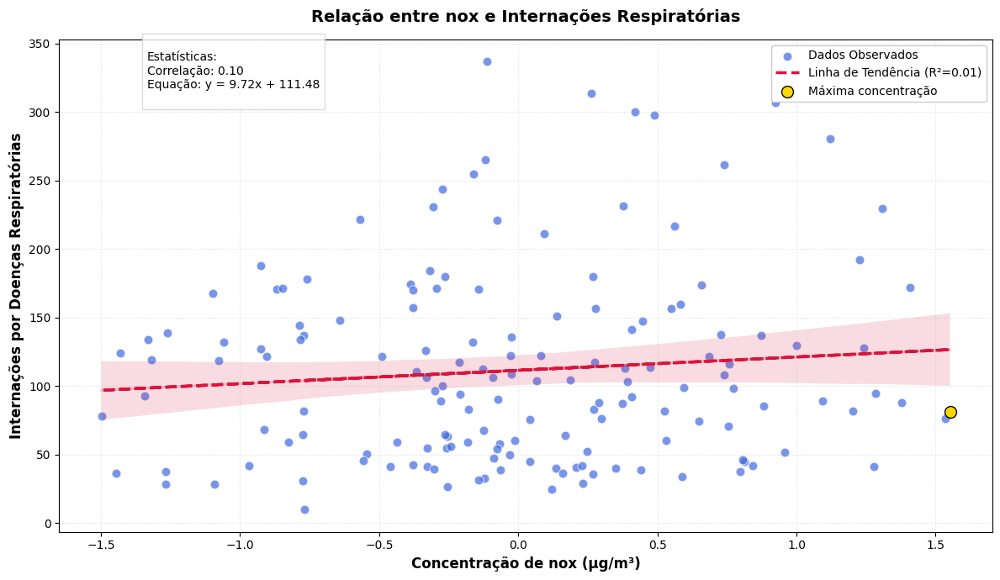

In [ ]:
#@title Gráfico de Dispersão: NOX vs Internações

# Configurações iniciais
plt.figure(figsize=(12, 7))

# ========== GRÁFICO PRINCIPAL ==========
# Scatter plot com pontos uniformes
plt.scatter(
    x=df_merged[poluente],
    y=df_merged['num_internacoes'],
    color='royalblue',  # Cor única para todos os pontos
    s=60,              # Tamanho fixo
    alpha=0.7,
    edgecolor='white',
    linewidth=0.8,
    label='Dados Observados'
)

# ========== LINHA DE TENDÊNCIA ==========
# Regressão linear
reg = LinearRegression()
X = df_merged[poluente].values.reshape(-1, 1)
y = df_merged['num_internacoes'].values
reg.fit(X, y)
y_pred = reg.predict(X)

# Plot da linha de regressão
plt.plot(X, y_pred, color='crimson', linewidth=2.5, linestyle='--',
         label=f'Linha de Tendência (R²={reg.score(X,y):.2f})')

# Intervalo de confiança (mais sutil)
sns.regplot(x=df_merged[poluente], y=df_merged['num_internacoes'],
            scatter=False, ci=95,
            line_kws={'color':'crimson', 'alpha':0.2})

# ========== ELEMENTOS ESTATÍSTICOS ==========
# Caixa de texto com estatísticas (mais discreta)
stats_text = f'''
Estatísticas:
Correlação: {df_merged[poluente].corr(df_merged["num_internacoes"]):.2f}
Equação: y = {reg.coef_[0]:.2f}x + {reg.intercept_:.2f}
'''
plt.gcf().text(0.15, 0.82, stats_text,
              bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgray'),
              fontsize=10)

# ========== FORMATANDO VISUALIZAÇÃO ==========
# Rótulos e título
plt.xlabel(f'Concentração de {poluente} (µg/m³)', fontsize=12, fontweight='bold')
plt.ylabel('Internações por Doenças Respiratórias', fontsize=12, fontweight='bold')
plt.title(f'Relação entre {poluente} e Internações Respiratórias',
          fontsize=14, pad=15, fontweight='bold')

# Grade e layout
plt.grid(True, which='both', linestyle=':', alpha=0.4)
plt.tight_layout()

# ========== DESTAQUES ==========
# Destacar apenas o ponto de máximo (opcional)
max_pm_idx = df_merged[poluente].idxmax()
plt.scatter(df_merged.loc[max_pm_idx, poluente],
            df_merged.loc[max_pm_idx, 'num_internacoes'],
            color='gold', s=100, edgecolor='black',
            label='Máxima concentração')

# Legendas
plt.legend(loc='upper right', framealpha=1)

plt.show()

#### Serie temporal

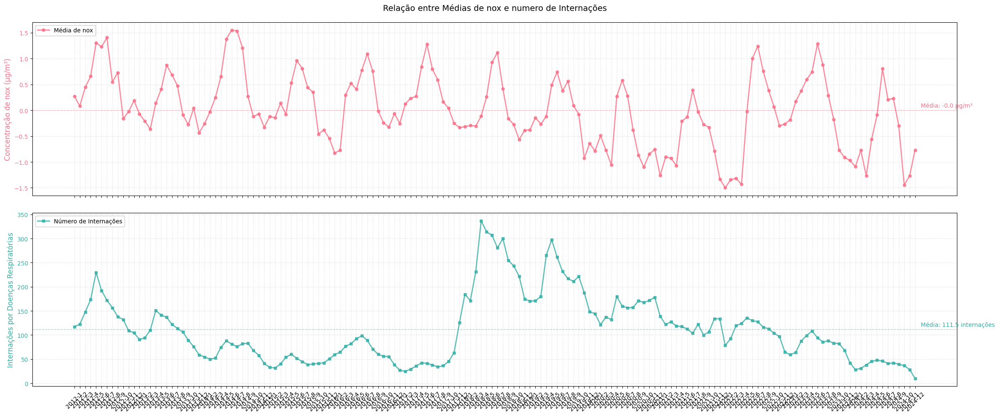

In [ ]:
#@title Gráfico Principal: Relação entre NOX e Internações com Eixo X

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Mesma paleta do gráfico principal

# Criar figura com subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10), sharex=True)  # Gráficos empilhados para melhor comparação

# --- Gráfico 1: Média Móvel de NOX ---
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'Média de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2,
        marker='o',
        markersize=5,
        alpha=0.8)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.5)
ax1.legend(loc='upper left', framealpha=1)
ax1.set_title(f'Relação entre Médias de {poluente} e numero de Internações', fontsize=14, pad=20)

# --- Gráfico 2: Internações ---
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2,
        marker='s',
        markersize=5,
        alpha=0.8)


ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.5)
ax2.legend(loc='upper left', framealpha=1)

# --- Melhorias no Eixo X ---
# Formatação das datas
plt.xticks(rotation=45)

# --- Elementos Adicionais ---
# Adicionar valores médios como linhas de referência
mean_pm = df_merged[poluente].mean()
mean_int = df_merged['num_internacoes'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[0],
            fontsize=10)

ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[1],
            fontsize=10)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)  # Reduzir espaço entre os gráficos

# Mostrar o gráfico
plt.show()

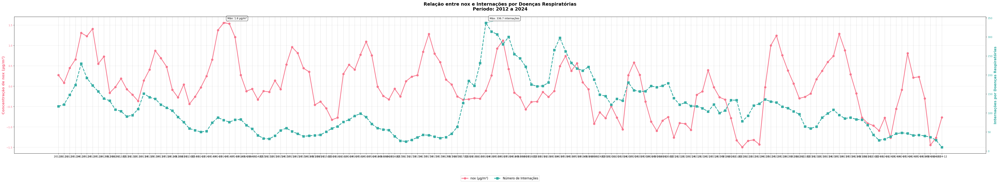

In [ ]:
#@title Gráfico Principal Sobreposto: Relação entre NOX e Internações

palette = sns.color_palette("husl", 2)

# Criar figura com tamanho aumentado
plt.figure(figsize=(55, 10))  # Aumentei a altura para 10 para melhor espaçamento

# Eixo principal
ax1 = plt.gca()

# Plotar NOX (eixo esquerdo)
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'{poluente} (µg/m³)',
        color=palette[0],
        marker='o',
        linestyle='-',
        linewidth=3,
        markersize=8,
        alpha=0.9)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)',
              color=palette[0],
              fontsize=14,
              fontweight='bold')
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, alpha=0.3)

# Eixo direito para internações
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='--',
        marker='s',
        linewidth=3,
        markersize=8)
ax2.set_ylabel('Internações por Doenças Respiratórias',
              color=palette[1],
              fontsize=14,
              fontweight='bold')
ax2.tick_params(axis='y', labelcolor=palette[1])

# Destacar valores máximos
max_pm = df_merged[poluente].max()
max_pm_date = df_merged.loc[df_merged[poluente].idxmax(), 'mes_ano']
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[0]))

max_int = df_merged['num_internacoes'].max()
max_int_date = df_merged.loc[df_merged['num_internacoes'].idxmax(), 'mes_ano']
ax2.annotate(f'Máx: {max_int} internações',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[1]))

# ===== MELHORIAS NO EIXO X =====

# Adicionar linhas de grade para os anos
ax1.grid(which='major', axis='x', linestyle='-', alpha=0.5)
ax1.grid(which='minor', axis='x', linestyle=':', alpha=0.3)

# Ajustar margens para evitar cortes
plt.margins(x=0.05)

# ===== TÍTULO E LEGENDAS =====
plt.title(f'Relação entre {poluente} e Internações por Doenças Respiratórias\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=18,
         fontweight='bold',
         pad=25)

# Legendas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=2,
          fontsize=12)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Mais espaço na parte inferior

plt.show()

#### Media movel

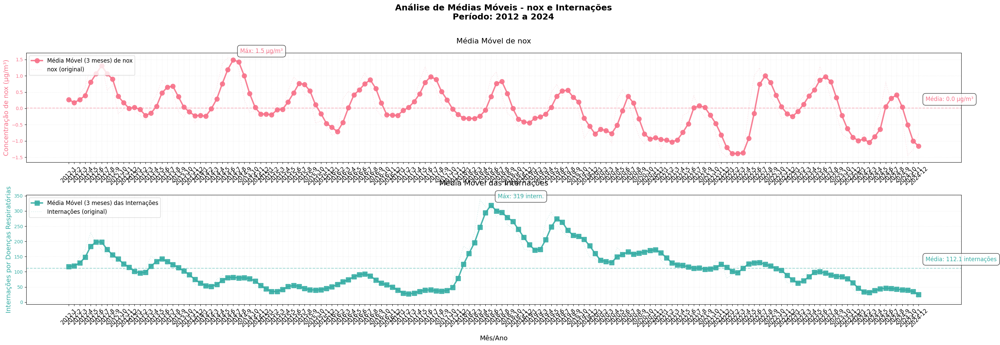

In [ ]:
#@title Gráficos Separados

# Configurações iniciais
palette = sns.color_palette("husl", 2)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(30, 10))  # 2 linhas, 1 coluna


df_merged[f'{poluente}_moving_avg'] = df_merged[poluente].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses
df_merged['internacoes_moving_avg'] = df_merged['num_internacoes'].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses

# --- Primeiro Gráfico: Média Móvel do Poluente ---
# Média móvel
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=3,
        marker='o',
        markersize=10,
        alpha=0.9)

# Série original
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=14)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)
ax1.set_title(f'Média Móvel de {poluente}', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1.5)
ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmax(), 'mes_ano']
max_pm = df_merged[f'{poluente}_moving_avg'].max()
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax1.legend(loc='upper left', fontsize=12)

# --- Segundo Gráfico: Média Móvel das Internações ---
# Média móvel
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=3,
        marker='s',
        markersize=10,
        alpha=0.9)

# Série original
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_xlabel('Mês/Ano', fontsize=14, labelpad=15)
ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=14)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.3)
ax2.set_title('Média Móvel das Internações', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax2.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_int = df_merged['internacoes_moving_avg'].mean()
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1.5)
ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax2.legend(loc='upper left', fontsize=12)

# --- Ajustes Finais ---
plt.suptitle(f'Análise de Médias Móveis - {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
             fontsize=18,
             y=1.02,
             fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0.3)  # Espaço entre os gráficos

plt.show()

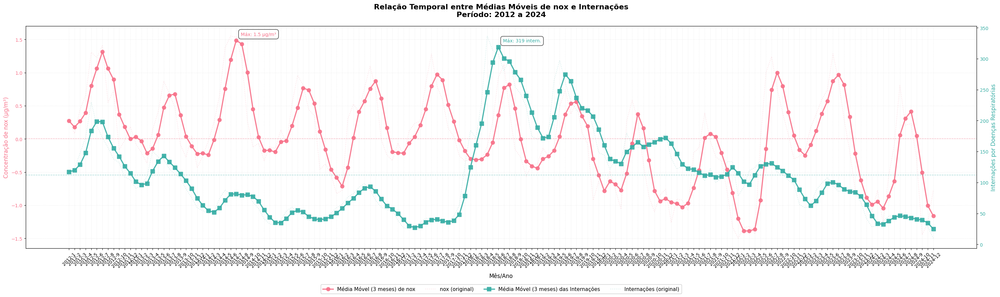

In [ ]:
#@title Média Móvel Sobreposta

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Paleta harmoniosa

# Criar figura
plt.figure(figsize=(30, 10))  # Mantendo a largura original, mas ajustando altura

# Eixo principal
ax1 = plt.gca()

# --- Média Móvel do Poluente (Eixo Esquerdo) ---
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2.5,
        marker='o',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_xlabel('Mês/Ano', fontsize=12, labelpad=10)
ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=10)  # Adicionado aqui

# --- Média Móvel das Internações (Eixo Direito) ---
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2.5,
        marker='s',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])

# --- Melhorias Visuais ---
# Título
plt.title(f'Relação Temporal entre Médias Móveis de {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=16,
         pad=20,
         fontweight='bold')

# Legendas unificadas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=4,
          fontsize=11,
          framealpha=1)

# Destacar valores médios
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
mean_int = df_merged['internacoes_moving_avg'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

# Anotações para valores máximos
max_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmax(), 'mes_ano']
max_pm = df_merged[f'{poluente}_moving_avg'].max()
ax1.annotate(f'Máx: {max_pm:.1f} µg/m³',
            xy=(max_pm_date, max_pm),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[0],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[1],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

# Ajustar layout com mais espaço na parte inferior para a legenda
plt.tight_layout()
plt.subplots_adjust(bottom=0.25)  # Aumentado para 0.25 para acomodar labels rotacionados

plt.show()

### Temperatura

https://bvsms.saude.gov.br/27-5-inverno-aumenta-risco-de-doencas-respiratorias/

https://portal.prodam.sp.gov.br/w/temperaturas-baixas-aumentam-incidencias-de-doencas-respiratorias

https://cetesb.sp.gov.br/ar/poluentes/#:~:text=No%20inverno%2C%20frequentemente%20ocorrem%20dias,pele%20e%20irrita%C3%A7%C3%A3o%20dos%20olhos.

In [ ]:
poluente = 'temp'

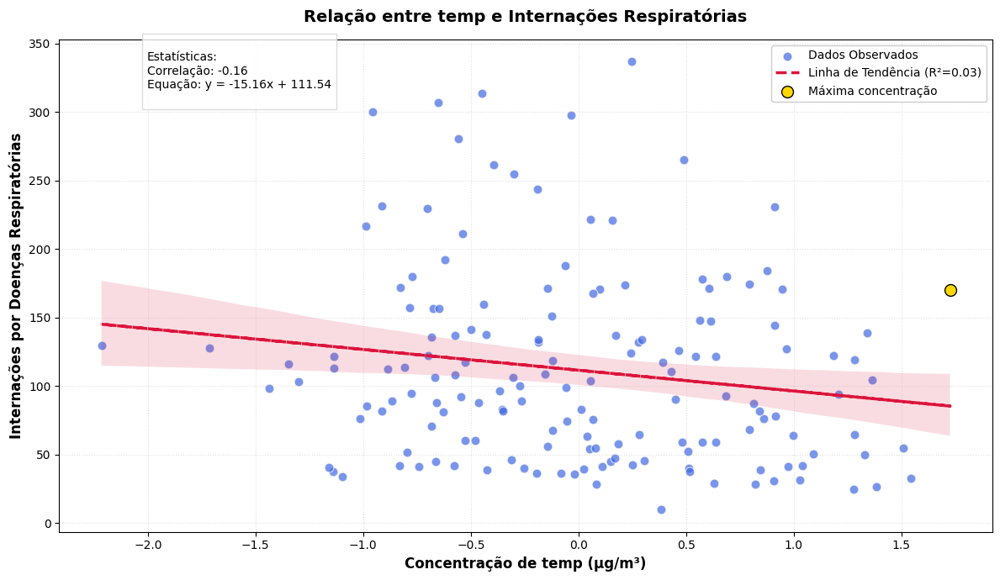

In [ ]:
#@title Gráfico de Dispersão: Temperatura vs Internações

# Configurações iniciais
plt.figure(figsize=(12, 7))

# ========== GRÁFICO PRINCIPAL ==========
# Scatter plot com pontos uniformes
plt.scatter(
    x=df_merged[poluente],
    y=df_merged['num_internacoes'],
    color='royalblue',  # Cor única para todos os pontos
    s=60,              # Tamanho fixo
    alpha=0.7,
    edgecolor='white',
    linewidth=0.8,
    label='Dados Observados'
)

# ========== LINHA DE TENDÊNCIA ==========
# Regressão linear
reg = LinearRegression()
X = df_merged[poluente].values.reshape(-1, 1)
y = df_merged['num_internacoes'].values
reg.fit(X, y)
y_pred = reg.predict(X)

# Plot da linha de regressão
plt.plot(X, y_pred, color='crimson', linewidth=2.5, linestyle='--',
         label=f'Linha de Tendência (R²={reg.score(X,y):.2f})')

# Intervalo de confiança (mais sutil)
sns.regplot(x=df_merged[poluente], y=df_merged['num_internacoes'],
            scatter=False, ci=95,
            line_kws={'color':'crimson', 'alpha':0.2})

# ========== ELEMENTOS ESTATÍSTICOS ==========
# Caixa de texto com estatísticas (mais discreta)
stats_text = f'''
Estatísticas:
Correlação: {df_merged[poluente].corr(df_merged["num_internacoes"]):.2f}
Equação: y = {reg.coef_[0]:.2f}x + {reg.intercept_:.2f}
'''
plt.gcf().text(0.15, 0.82, stats_text,
              bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgray'),
              fontsize=10)

# ========== FORMATANDO VISUALIZAÇÃO ==========
# Rótulos e título
plt.xlabel(f'Concentração de {poluente} (µg/m³)', fontsize=12, fontweight='bold')
plt.ylabel('Internações por Doenças Respiratórias', fontsize=12, fontweight='bold')
plt.title(f'Relação entre {poluente} e Internações Respiratórias',
          fontsize=14, pad=15, fontweight='bold')

# Grade e layout
plt.grid(True, which='both', linestyle=':', alpha=0.4)
plt.tight_layout()

# ========== DESTAQUES ==========
# Destacar apenas o ponto de máximo (opcional)
max_pm_idx = df_merged[poluente].idxmax()
plt.scatter(df_merged.loc[max_pm_idx, poluente],
            df_merged.loc[max_pm_idx, 'num_internacoes'],
            color='gold', s=100, edgecolor='black',
            label='Máxima concentração')

# Legendas
plt.legend(loc='upper right', framealpha=1)

plt.show()

#### Serie temporal

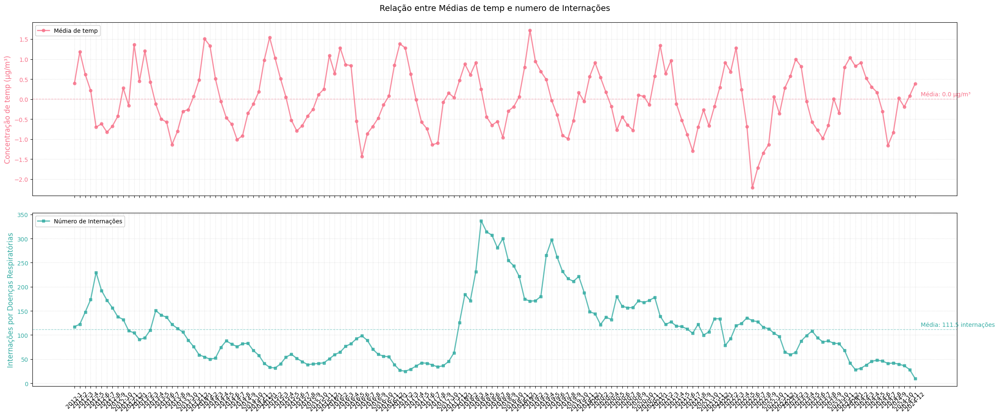

In [ ]:
#@title Gráfico Principal: Relação entre Temperatura e Internações com Eixo X

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Mesma paleta do gráfico principal

# Criar figura com subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10), sharex=True)  # Gráficos empilhados para melhor comparação

# --- Gráfico 1: Média Móvel de Temperatura ---
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'Média de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2,
        marker='o',
        markersize=5,
        alpha=0.8)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.5)
ax1.legend(loc='upper left', framealpha=1)
ax1.set_title(f'Relação entre Médias de {poluente} e numero de Internações', fontsize=14, pad=20)

# --- Gráfico 2: Internações ---
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2,
        marker='s',
        markersize=5,
        alpha=0.8)


ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.5)
ax2.legend(loc='upper left', framealpha=1)

# --- Melhorias no Eixo X ---
# Formatação das datas
plt.xticks(rotation=45)

# --- Elementos Adicionais ---
# Adicionar valores médios como linhas de referência
mean_pm = df_merged[poluente].mean()
mean_int = df_merged['num_internacoes'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[0],
            fontsize=10)

ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[1],
            fontsize=10)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)  # Reduzir espaço entre os gráficos

# Mostrar o gráfico
plt.show()

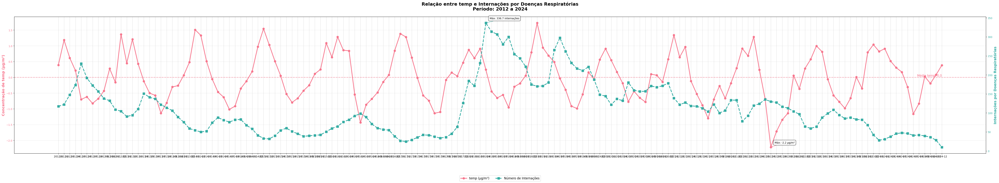

In [ ]:
#@title Gráfico Principal Sobreposto: Relação entre Temperatura e Internações

palette = sns.color_palette("husl", 2)

# Criar figura com tamanho aumentado
plt.figure(figsize=(55, 10))  # Aumentei a altura para 10 para melhor espaçamento

# Eixo principal
ax1 = plt.gca()

# Plotar Temperatura (eixo esquerdo)
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'{poluente} (µg/m³)',
        color=palette[0],
        marker='o',
        linestyle='-',
        linewidth=3,
        markersize=8,
        alpha=0.9)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)',
              color=palette[0],
              fontsize=14,
              fontweight='bold')
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, alpha=0.3)

# Calcular médias
media_poluente = df_merged[poluente].mean()
media_internacoes = df_merged['num_internacoes'].mean()

# Adicionar linha de média no eixo do poluente (ax1)
ax1.axhline(y=media_poluente, color=palette[0], linestyle='--', linewidth=2, alpha=0.6)
ax1.text(df_merged['mes_ano'].iloc[-1], media_poluente, f'Média {poluente}: {media_poluente:.1f}',
         color=palette[0], fontsize=12, va='bottom', ha='right')

# Adicionar linha de média no eixo das internações (ax2)
ax2.axhline(y=media_internacoes, color=palette[1], linestyle='--', linewidth=2, alpha=0.6)
ax2.text(df_merged['mes_ano'].iloc[-1], media_internacoes, f'Média Internações: {media_internacoes:.0f}',
         color=palette[1], fontsize=12, va='bottom', ha='right')

# Eixo direito para internações
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='--',
        marker='s',
        linewidth=3,
        markersize=8)
ax2.set_ylabel('Internações por Doenças Respiratórias',
              color=palette[1],
              fontsize=14,
              fontweight='bold')
ax2.tick_params(axis='y', labelcolor=palette[1])

# Destacar valores máximos
min_pm = df_merged[poluente].min()
min_pm_date = df_merged.loc[df_merged[poluente].idxmin(), 'mes_ano']
ax1.annotate(f'Máx: {min_pm:.1f} µg/m³',
            xy=(min_pm_date, min_pm),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[0]))

max_int = df_merged['num_internacoes'].max()
max_int_date = df_merged.loc[df_merged['num_internacoes'].idxmax(), 'mes_ano']
ax2.annotate(f'Máx: {max_int} internações',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[1]))

# ===== MELHORIAS NO EIXO X =====

# Adicionar linhas de grade para os anos
ax1.grid(which='major', axis='x', linestyle='-', alpha=0.5)
ax1.grid(which='minor', axis='x', linestyle=':', alpha=0.3)

# Ajustar margens para evitar cortes
plt.margins(x=0.05)

# ===== TÍTULO E LEGENDAS =====
plt.title(f'Relação entre {poluente} e Internações por Doenças Respiratórias\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=18,
         fontweight='bold',
         pad=25)

# Legendas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=2,
          fontsize=12)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Mais espaço na parte inferior

plt.show()

#### Media movel

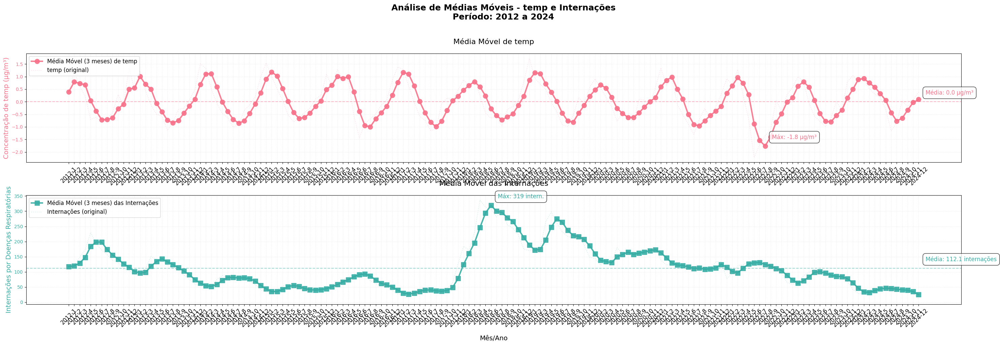

In [ ]:
#@title Gráficos Separados

# Configurações iniciais
palette = sns.color_palette("husl", 2)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(30, 10))  # 2 linhas, 1 coluna


df_merged[f'{poluente}_moving_avg'] = df_merged[poluente].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses
df_merged['internacoes_moving_avg'] = df_merged['num_internacoes'].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses

# --- Primeiro Gráfico: Média Móvel do Poluente ---
# Média móvel
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=3,
        marker='o',
        markersize=10,
        alpha=0.9)

# Série original
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=14)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)
ax1.set_title(f'Média Móvel de {poluente}', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1.5)
ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
min_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmin(), 'mes_ano']
min_pm = df_merged[f'{poluente}_moving_avg'].min()
ax1.annotate(f'Máx: {min_pm:.1f} µg/m³',
            xy=(min_pm_date, min_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax1.legend(loc='upper left', fontsize=12)

# --- Segundo Gráfico: Média Móvel das Internações ---
# Média móvel
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=3,
        marker='s',
        markersize=10,
        alpha=0.9)

# Série original
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_xlabel('Mês/Ano', fontsize=14, labelpad=15)
ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=14)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.3)
ax2.set_title('Média Móvel das Internações', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax2.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_int = df_merged['internacoes_moving_avg'].mean()
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1.5)
ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax2.legend(loc='upper left', fontsize=12)

# --- Ajustes Finais ---
plt.suptitle(f'Análise de Médias Móveis - {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
             fontsize=18,
             y=1.02,
             fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0.3)  # Espaço entre os gráficos

plt.show()

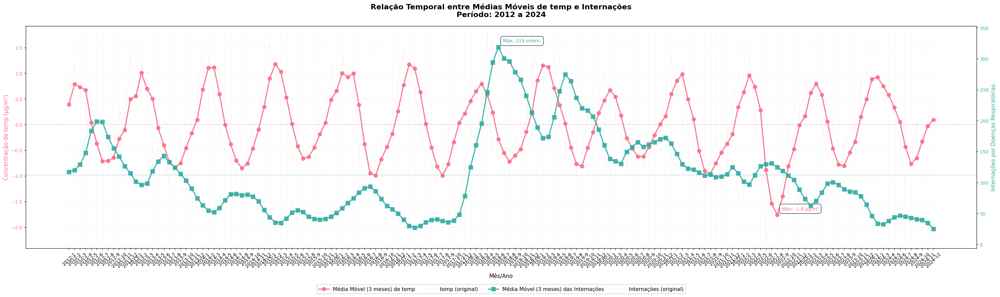

In [ ]:
#@title Média Móvel Sobreposta

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Paleta harmoniosa

# Criar figura
plt.figure(figsize=(30, 10))  # Mantendo a largura original, mas ajustando altura

# Eixo principal
ax1 = plt.gca()

# --- Média Móvel do Poluente (Eixo Esquerdo) ---
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2.5,
        marker='o',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_xlabel('Mês/Ano', fontsize=12, labelpad=10)
ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=10)  # Adicionado aqui

# --- Média Móvel das Internações (Eixo Direito) ---
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2.5,
        marker='s',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])

# --- Melhorias Visuais ---
# Título
plt.title(f'Relação Temporal entre Médias Móveis de {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=16,
         pad=20,
         fontweight='bold')

# Legendas unificadas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=4,
          fontsize=11,
          framealpha=1)

# Destacar valores médios
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
mean_int = df_merged['internacoes_moving_avg'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

# Anotações para valores máximos
min_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmin(), 'mes_ano']
min_pm = df_merged[f'{poluente}_moving_avg'].min()
ax1.annotate(f'Máx: {min_pm:.1f} µg/m³',
            xy=(min_pm_date, min_pm),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[0],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[1],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

# Ajustar layout com mais espaço na parte inferior para a legenda
plt.tight_layout()
plt.subplots_adjust(bottom=0.25)  # Aumentado para 0.25 para acomodar labels rotacionados

plt.show()

### Ozônio

https://blog.quantumlife.com.br/ozonioterapia/

In [ ]:
poluente = 'o3'

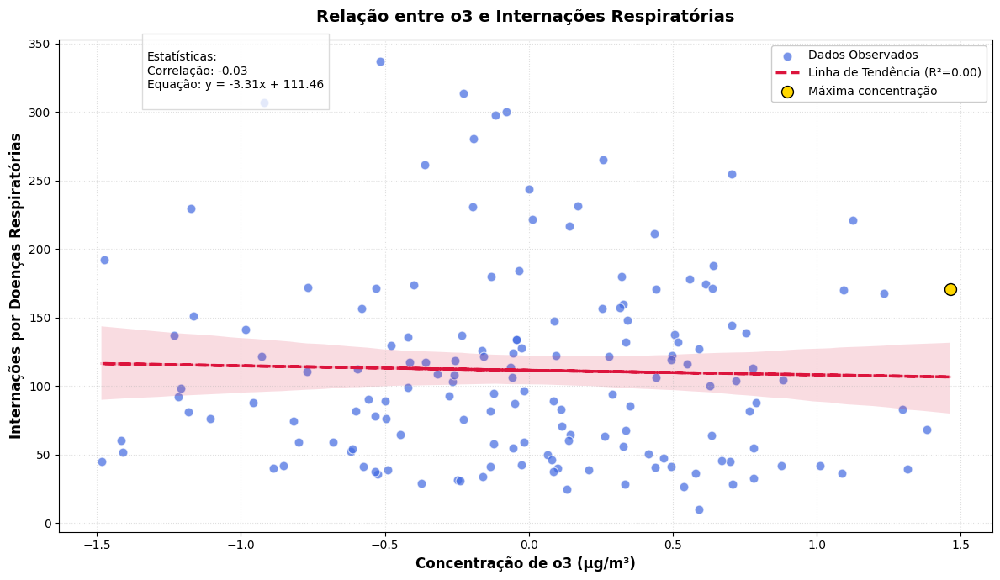

In [ ]:
#@title Gráfico de Dispersão: Ozônio vs Internações

# Configurações iniciais
plt.figure(figsize=(12, 7))

# ========== GRÁFICO PRINCIPAL ==========
# Scatter plot com pontos uniformes
plt.scatter(
    x=df_merged[poluente],
    y=df_merged['num_internacoes'],
    color='royalblue',  # Cor única para todos os pontos
    s=60,              # Tamanho fixo
    alpha=0.7,
    edgecolor='white',
    linewidth=0.8,
    label='Dados Observados'
)

# ========== LINHA DE TENDÊNCIA ==========
# Regressão linear
reg = LinearRegression()
X = df_merged[poluente].values.reshape(-1, 1)
y = df_merged['num_internacoes'].values
reg.fit(X, y)
y_pred = reg.predict(X)

# Plot da linha de regressão
plt.plot(X, y_pred, color='crimson', linewidth=2.5, linestyle='--',
         label=f'Linha de Tendência (R²={reg.score(X,y):.2f})')

# Intervalo de confiança (mais sutil)
sns.regplot(x=df_merged[poluente], y=df_merged['num_internacoes'],
            scatter=False, ci=95,
            line_kws={'color':'crimson', 'alpha':0.2})

# ========== ELEMENTOS ESTATÍSTICOS ==========
# Caixa de texto com estatísticas (mais discreta)
stats_text = f'''
Estatísticas:
Correlação: {df_merged[poluente].corr(df_merged["num_internacoes"]):.2f}
Equação: y = {reg.coef_[0]:.2f}x + {reg.intercept_:.2f}
'''
plt.gcf().text(0.15, 0.82, stats_text,
              bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgray'),
              fontsize=10)

# ========== FORMATANDO VISUALIZAÇÃO ==========
# Rótulos e título
plt.xlabel(f'Concentração de {poluente} (µg/m³)', fontsize=12, fontweight='bold')
plt.ylabel('Internações por Doenças Respiratórias', fontsize=12, fontweight='bold')
plt.title(f'Relação entre {poluente} e Internações Respiratórias',
          fontsize=14, pad=15, fontweight='bold')

# Grade e layout
plt.grid(True, which='both', linestyle=':', alpha=0.4)
plt.tight_layout()

# ========== DESTAQUES ==========
# Destacar apenas o ponto de máximo (opcional)
max_pm_idx = df_merged[poluente].idxmax()
plt.scatter(df_merged.loc[max_pm_idx, poluente],
            df_merged.loc[max_pm_idx, 'num_internacoes'],
            color='gold', s=100, edgecolor='black',
            label='Máxima concentração')

# Legendas
plt.legend(loc='upper right', framealpha=1)

plt.show()

#### Serie temporal

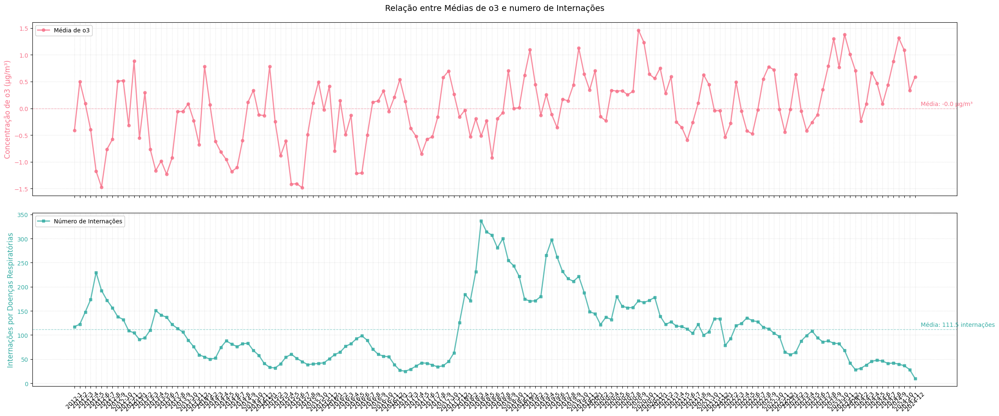

In [ ]:
#@title Gráfico Principal: Relação entre Ozônio e Internações com Eixo X

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Mesma paleta do gráfico principal

# Criar figura com subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10), sharex=True)  # Gráficos empilhados para melhor comparação

# --- Gráfico 1: Média Móvel de Ozônio ---
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'Média de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2,
        marker='o',
        markersize=5,
        alpha=0.8)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.5)
ax1.legend(loc='upper left', framealpha=1)
ax1.set_title(f'Relação entre Médias de {poluente} e numero de Internações', fontsize=14, pad=20)

# --- Gráfico 2: Internações ---
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2,
        marker='s',
        markersize=5,
        alpha=0.8)


ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.5)
ax2.legend(loc='upper left', framealpha=1)

# --- Melhorias no Eixo X ---
# Formatação das datas
plt.xticks(rotation=45)

# --- Elementos Adicionais ---
# Adicionar valores médios como linhas de referência
mean_pm = df_merged[poluente].mean()
mean_int = df_merged['num_internacoes'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[0],
            fontsize=10)

ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(10, 5),
            textcoords='offset points',
            color=palette[1],
            fontsize=10)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)  # Reduzir espaço entre os gráficos

# Mostrar o gráfico
plt.show()

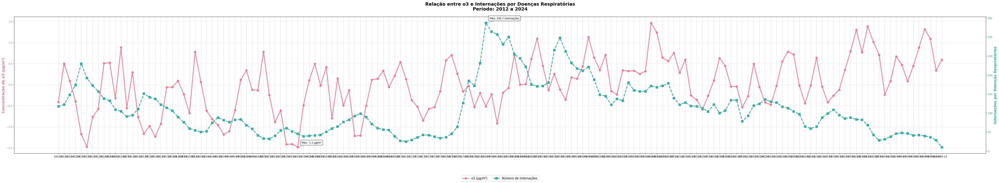

In [ ]:
#@title Gráfico Principal Sobreposto: Relação entre Ozônio e Internações

palette = sns.color_palette("husl", 2)

# Criar figura com tamanho aumentado
plt.figure(figsize=(55, 10))  # Aumentei a altura para 10 para melhor espaçamento

# Eixo principal
ax1 = plt.gca()

# Plotar Ozônio (eixo esquerdo)
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        label=f'{poluente} (µg/m³)',
        color=palette[0],
        marker='o',
        linestyle='-',
        linewidth=3,
        markersize=8,
        alpha=0.9)

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)',
              color=palette[0],
              fontsize=14,
              fontweight='bold')
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, alpha=0.3)

# Eixo direito para internações
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        label='Número de Internações',
        color=palette[1],
        linestyle='--',
        marker='s',
        linewidth=3,
        markersize=8)
ax2.set_ylabel('Internações por Doenças Respiratórias',
              color=palette[1],
              fontsize=14,
              fontweight='bold')
ax2.tick_params(axis='y', labelcolor=palette[1])

# Destacar valores máximos
min_pm = df_merged[poluente].min()
min_pm_date = df_merged.loc[df_merged[poluente].idxmin(), 'mes_ano']
ax1.annotate(f'Máx: {min_pm:.1f} µg/m³',
            xy=(min_pm_date, min_pm),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[0]))

max_int = df_merged['num_internacoes'].max()
max_int_date = df_merged.loc[df_merged['num_internacoes'].idxmax(), 'mes_ano']
ax2.annotate(f'Máx: {max_int} internações',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9),
            arrowprops=dict(arrowstyle='->', color=palette[1]))

# ===== MELHORIAS NO EIXO X =====

# Adicionar linhas de grade para os anos
ax1.grid(which='major', axis='x', linestyle='-', alpha=0.5)
ax1.grid(which='minor', axis='x', linestyle=':', alpha=0.3)

# Ajustar margens para evitar cortes
plt.margins(x=0.05)

# ===== TÍTULO E LEGENDAS =====
plt.title(f'Relação entre {poluente} e Internações por Doenças Respiratórias\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=18,
         fontweight='bold',
         pad=25)

# Legendas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=2,
          fontsize=12)

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Mais espaço na parte inferior

plt.show()

#### Media movel

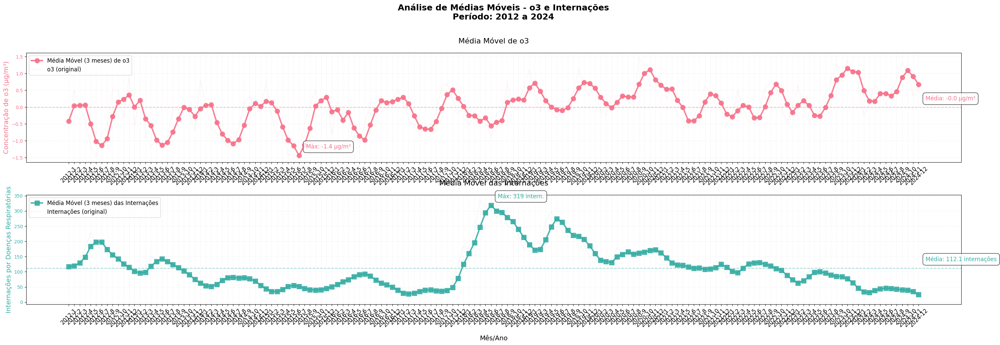

In [ ]:
#@title Gráficos Separados

# Configurações iniciais
palette = sns.color_palette("husl", 2)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(30, 10))  # 2 linhas, 1 coluna


df_merged[f'{poluente}_moving_avg'] = df_merged[poluente].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses
df_merged['internacoes_moving_avg'] = df_merged['num_internacoes'].rolling(window=3, min_periods=1).mean()  # Média móvel de 3 meses

# --- Primeiro Gráfico: Média Móvel do Poluente ---
# Média móvel
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=3,
        marker='o',
        markersize=10,
        alpha=0.9)

# Série original
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=14)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)
ax1.set_title(f'Média Móvel de {poluente}', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1.5)
ax1.annotate(f'Média: {mean_pm:.1f} µg/m³',
            xy=(df_merged['mes_ano'].iloc[-1], mean_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
min_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmin(), 'mes_ano']
min_pm = df_merged[f'{poluente}_moving_avg'].min()
ax1.annotate(f'Máx: {min_pm:.1f} µg/m³',
            xy=(min_pm_date, min_pm),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[0],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax1.legend(loc='upper left', fontsize=12)

# --- Segundo Gráfico: Média Móvel das Internações ---
# Média móvel
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=3,
        marker='s',
        markersize=10,
        alpha=0.9)

# Série original
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_xlabel('Mês/Ano', fontsize=14, labelpad=15)
ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=14)
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.grid(True, linestyle=':', alpha=0.3)
ax2.set_title('Média Móvel das Internações', fontsize=16, pad=20)

# Rotacionar labels do eixo X em 45°
ax2.tick_params(axis='x', rotation=45, labelsize=12)  # Adicionado rotation=45

# Linha de média e anotação
mean_int = df_merged['internacoes_moving_avg'].mean()
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1.5)
ax2.annotate(f'Média: {mean_int:.1f} internações',
            xy=(df_merged['mes_ano'].iloc[-1], mean_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

# Destacar valor máximo
max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(15, 15),
            textcoords='offset points',
            color=palette[1],
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))

ax2.legend(loc='upper left', fontsize=12)

# --- Ajustes Finais ---
plt.suptitle(f'Análise de Médias Móveis - {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
             fontsize=18,
             y=1.02,
             fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0.3)  # Espaço entre os gráficos

plt.show()

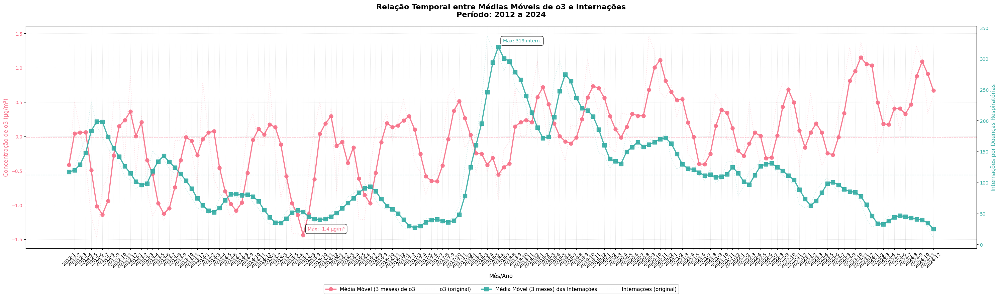

In [ ]:
#@title Média Móvel Sobreposta

# Configurações iniciais
palette = sns.color_palette("husl", 2)  # Paleta harmoniosa

# Criar figura
plt.figure(figsize=(30, 10))  # Mantendo a largura original, mas ajustando altura

# Eixo principal
ax1 = plt.gca()

# --- Média Móvel do Poluente (Eixo Esquerdo) ---
ax1.plot(df_merged['mes_ano'], df_merged[f'{poluente}_moving_avg'],
        label=f'Média Móvel (3 meses) de {poluente}',
        color=palette[0],
        linestyle='-',
        linewidth=2.5,
        marker='o',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax1.plot(df_merged['mes_ano'], df_merged[poluente],
        color=palette[0],
        linestyle=':',
        alpha=0.2,
        label=f'{poluente} (original)')

ax1.set_xlabel('Mês/Ano', fontsize=12, labelpad=10)
ax1.set_ylabel(f'Concentração de {poluente} (µg/m³)', color=palette[0], fontsize=12)
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.grid(True, linestyle=':', alpha=0.3)

# Rotacionar labels do eixo X em 45°
ax1.tick_params(axis='x', rotation=45, labelsize=10)  # Adicionado aqui

# --- Média Móvel das Internações (Eixo Direito) ---
ax2 = ax1.twinx()
ax2.plot(df_merged['mes_ano'], df_merged['internacoes_moving_avg'],
        label='Média Móvel (3 meses) das Internações',
        color=palette[1],
        linestyle='-',
        linewidth=2.5,
        marker='s',
        markersize=8,
        alpha=0.9)

# Adicionar série original transparente para contexto
ax2.plot(df_merged['mes_ano'], df_merged['num_internacoes'],
        color=palette[1],
        linestyle=':',
        alpha=0.2,
        label='Internações (original)')

ax2.set_ylabel('Internações por Doenças Respiratórias', color=palette[1], fontsize=12)
ax2.tick_params(axis='y', labelcolor=palette[1])

# --- Melhorias Visuais ---
# Título
plt.title(f'Relação Temporal entre Médias Móveis de {poluente} e Internações\nPeríodo: {df_merged["ano"].min()} a {df_merged["ano"].max()}',
         fontsize=16,
         pad=20,
         fontweight='bold')

# Legendas unificadas
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
          loc='upper center',
          bbox_to_anchor=(0.5, -0.15),
          ncol=4,
          fontsize=11,
          framealpha=1)

# Destacar valores médios
mean_pm = df_merged[f'{poluente}_moving_avg'].mean()
mean_int = df_merged['internacoes_moving_avg'].mean()

ax1.axhline(mean_pm, color=palette[0], linestyle='--', alpha=0.5, linewidth=1)
ax2.axhline(mean_int, color=palette[1], linestyle='--', alpha=0.5, linewidth=1)

# Anotações para valores máximos
min_pm_date = df_merged.loc[df_merged[f'{poluente}_moving_avg'].idxmin(), 'mes_ano']
min_pm = df_merged[f'{poluente}_moving_avg'].min()
ax1.annotate(f'Máx: {min_pm:.1f} µg/m³',
            xy=(min_pm_date, min_pm),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[0],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

max_int_date = df_merged.loc[df_merged['internacoes_moving_avg'].idxmax(), 'mes_ano']
max_int = df_merged['internacoes_moving_avg'].max()
ax2.annotate(f'Máx: {max_int:.0f} intern.',
            xy=(max_int_date, max_int),
            xytext=(10, 10),
            textcoords='offset points',
            color=palette[1],
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8),
            fontsize=10)

# Ajustar layout com mais espaço na parte inferior para a legenda
plt.tight_layout()
plt.subplots_adjust(bottom=0.25)  # Aumentado para 0.25 para acomodar labels rotacionados

plt.show()

In [ ]:
df_merged = df_merged.groupby(by=['ano', 'mes'])[['chuva', 'temp', 'ur', 'co', 'no', 'no2', 'nox', 'so2', 'o3', 'pm10', 'pm2_5', 'aqi', 'num_internacoes']].mean().reset_index()
df_merged['mes_ano'] = df_merged['ano'].astype(str) + '-' + df_merged['mes'].astype(str)